In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
import numpy as np
import os
from glob import glob
from sklearn.model_selection import train_test_split

# --- 1. Define Paths and Parameters ---
real_captured_train_low_path = '/kaggle/input/lolv2dataset/LOL-v2/Real_captured/Train/Low'
real_captured_train_normal_path = '/kaggle/input/lolv2dataset/LOL-v2/Real_captured/Train/Normal'
synthetic_train_low_path = '/kaggle/input/lolv2dataset/LOL-v2/Synthetic/Train/Low'
synthetic_train_normal_path = '/kaggle/input/lolv2dataset/LOL-v2/Synthetic/Train/Normal'

real_captured_test_low_path = '/kaggle/input/lolv2dataset/LOL-v2/Real_captured/Test/Low'
real_captured_test_normal_path = '/kaggle/input/lolv2dataset/LOL-v2/Real_captured/Test/Normal'
synthetic_test_low_path = '/kaggle/input/lolv2dataset/LOL-v2/Synthetic/Test/Low'
synthetic_test_normal_path = '/kaggle/input/lolv2dataset/LOL-v2/Synthetic/Test/Normal'

IMG_HEIGHT = 384
IMG_WIDTH = 384
BATCH_SIZE = 2  # Increased batch size slightly, adjust as per your GPU memory
BUFFER_SIZE = 400 # For shuffling

# --- 2. Get all image file paths ---
def get_paths(low_dir, normal_dir):
    low_paths = sorted(glob(os.path.join(low_dir, '*.png')))
    normal_paths = sorted(glob(os.path.join(normal_dir, '*.png')))
    return low_paths, normal_paths

# Get train paths from both real and synthetic datasets
train_low_paths_real, train_normal_paths_real = get_paths(real_captured_train_low_path, real_captured_train_normal_path)
train_low_paths_synth, train_normal_paths_synth = get_paths(synthetic_train_low_path, synthetic_train_normal_path)

# Get test paths
test_low_paths_real, test_normal_paths_real = get_paths(real_captured_test_low_path, real_captured_test_normal_path)
test_low_paths_synth, test_normal_paths_synth = get_paths(synthetic_test_low_path, synthetic_test_normal_path)

# Combine all paths
all_train_low_paths = train_low_paths_real + train_low_paths_synth
all_train_normal_paths = train_normal_paths_real + train_normal_paths_synth
all_test_low_paths = test_low_paths_real + test_low_paths_synth
all_test_normal_paths = test_normal_paths_real + test_normal_paths_synth

print(f"Found {len(all_train_low_paths)} training image pairs.")
print(f"Found {len(all_test_low_paths)} test image pairs.")

# --- 3. Split paths for training and validation ---
# We split the file paths, not the images themselves
train_low, val_low, train_normal, val_normal = train_test_split(
    all_train_low_paths, all_train_normal_paths, test_size=0.15, random_state=42
)

# --- 4. Create the TensorFlow Data Pipeline ---

# Helper function to load and preprocess a single image pair
def load_and_preprocess_image(low_path, normal_path):
    # Read files
    low_img = tf.io.read_file(low_path)
    normal_img = tf.io.read_file(normal_path)
    
    # Decode PNG images
    low_img = tf.image.decode_png(low_img, channels=3)
    normal_img = tf.image.decode_png(normal_img, channels=3)
    
    # Resize images
    low_img = tf.image.resize(low_img, [IMG_HEIGHT, IMG_WIDTH])
    normal_img = tf.image.resize(normal_img, [IMG_HEIGHT, IMG_WIDTH])
    
    # Normalize pixel values to [0, 1]
    low_img = tf.cast(low_img, tf.float32) / 255.0
    normal_img = tf.cast(normal_img, tf.float32) / 255.0
    
    return low_img, normal_img

# Function to build the tf.data.Dataset
def create_dataset(low_paths, normal_paths, is_training=True):
    # Create a dataset from the file paths
    dataset = tf.data.Dataset.from_tensor_slices((low_paths, normal_paths))
    
    # Use multiple parallel calls to load images faster
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    
    if is_training:
        # For training, we shuffle the data and repeat
        dataset = dataset.shuffle(BUFFER_SIZE)
    
    # Batch the data
    dataset = dataset.batch(BATCH_SIZE)
    
    # Prefetch the next batch while the current one is being processed
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    
    return dataset

# Create the datasets for training, validation, and testing
train_dataset = create_dataset(train_low, train_normal)
val_dataset = create_dataset(val_low, val_normal, is_training=False)
test_dataset = create_dataset(all_test_low_paths, all_test_normal_paths, is_training=False)

print("\nDatasets created successfully!")


2025-09-21 13:02:37.071849: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758459757.241359      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758459757.291050      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 1589 training image pairs.
Found 200 test image pairs.

Datasets created successfully!


I0000 00:00:1758459769.337899      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [5]:
# --- 2. IMPROVED LOSS FUNCTION ---
def ssim_loss(y_true, y_pred):
    return 1.0 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))

def combined_loss(y_true, y_pred, alpha=0.84):
    """
    Combines MAE and SSIM loss.
    alpha controls the weight of the SSIM loss.
    """
    # Use the fundamental TensorFlow operation for MAE to ensure compatibility
    mae = tf.reduce_mean(tf.abs(y_true - y_pred))
    
    ssim = ssim_loss(y_true, y_pred)
    return (1 - alpha) * mae + alpha * ssim

# --- 3. ENHANCED U-NET ARCHITECTURE ---
def conv_block(x, filters, kernel_size=3, activation=True):
    """Convolutional block with Conv2D -> Batch Norm -> Leaky ReLU."""
    x = layers.Conv2D(filters, kernel_size, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    if activation:
        x = layers.LeakyReLU(alpha=0.2)(x)
    return x

def build_enhanced_unet(input_shape=(384, 384, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = conv_block(inputs, 64)
    c1 = conv_block(c1, 64)
    p1 = layers.MaxPooling2D(2)(c1)

    c2 = conv_block(p1, 128)
    c2 = conv_block(c2, 128)
    p2 = layers.MaxPooling2D(2)(c2)

    c3 = conv_block(p2, 256)
    c3 = conv_block(c3, 256)
    p3 = layers.MaxPooling2D(2)(c3)

    c4 = conv_block(p3, 512)
    c4 = conv_block(c4, 512)
    p4 = layers.MaxPooling2D(2)(c4)

    # Bottleneck
    b = conv_block(p4, 1024)
    b = conv_block(b, 1024)

    # Decoder
    u1 = layers.UpSampling2D(2)(b)
    u1 = layers.Concatenate()([u1, c4])
    c5 = conv_block(u1, 512)
    c5 = conv_block(c5, 512)

    u2 = layers.UpSampling2D(2)(c5)
    u2 = layers.Concatenate()([u2, c3])
    c6 = conv_block(u2, 256)
    c6 = conv_block(c6, 256)

    u3 = layers.UpSampling2D(2)(c6)
    u3 = layers.Concatenate()([u3, c2])
    c7 = conv_block(u3, 128)
    c7 = conv_block(c7, 128)

    u4 = layers.UpSampling2D(2)(u3) # Corrected this line from your code, should be u3
    u4 = layers.Concatenate()([u4, c1])
    c8 = conv_block(u4, 64)
    c8 = conv_block(c8, 64)

    outputs = layers.Conv2D(3, 1, activation='sigmoid')(c8)

    model = models.Model(inputs, outputs)
    return model

# --- 4. BUILD, COMPILE, AND TRAIN ---
# Build and compile model
model = build_enhanced_unet()
# Using a slightly lower learning rate can also help with stability
optimizer = Adam(learning_rate=1e-4) 
model.compile(optimizer=optimizer, loss=combined_loss)

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 384, 384,  │      1,728 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 384, 384,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 384, 384,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 384, 384,  │     36,864 │ leaky_re_lu[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 384, 384,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 384, 384,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 192, 192,  │          0 │ leaky_re_lu_1[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 192, 192,  │     73,728 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 192, 192,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 192, 192,  │    147,456 │ leaky_re_lu_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 192, 192,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 96, 96,    │          0 │ leaky_re_lu_3[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 96, 96,    │    294,912 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 96, 96,    │      1,024 │ conv2d_4[0][0]  

 Total params: 30,953,347 (118.08 MB)

 Trainable params: 30,942,083 (118.03 MB)

 Non-trainable params: 11,264 (44.00 KB)

In [7]:
class ClearMemoryCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        gc.collect()
        tf.keras.backend.clear_session()
        # print(f"Memory cleared after epoch {epoch + 1}") # Optional: can be verbose

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=4, verbose=1, min_lr=1e-8
)
clear_memory = ClearMemoryCallback()
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    "best_model_Unet_enhanced.h5", monitor="val_loss", save_best_only=True, mode="min", verbose=1
)

In [8]:
# Train the model
history = model.fit(
    train_dataset,
    epochs=20,
    validation_data=val_dataset,
    callbacks=[lr_scheduler, checkpoint_cb] # Removed clear_memory for performance
)

Epoch 1/20


I0000 00:00:1758460227.516787      97 service.cc:148] XLA service 0x799054002fe0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758460227.517508      97 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
W0000 00:00:1758460228.206737      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1758460228.207532      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1758460228.208328      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1758460228.208908      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
I0000 00:00:1758460228.677097      97 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-09-21 13:10:31.890558: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng3{

  1/675 ━━━━━━━━━━━━━━━━━━━━ 7:14:58 39s/step - loss: 0.6760

I0000 00:00:1758460249.840130      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


675/675 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.2800

W0000 00:00:1758460351.451088      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1758460351.452166      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1758460351.453029      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1758460351.453554      97 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_3/Assert
W0000 00:00:1758460357.264995      96 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert/Assert
W0000 00:00:1758460357.265217      96 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_1/Assert
W0000 00:00:1758460357.265594      96 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/SSIM/Assert_2/Assert
W0000 00:00:1758460357.265839      96 assert_op.cc:38] Ignoring Assert operator compile_loss/combined_loss/S


Epoch 1: val_loss improved from inf to 0.22951, saving model to best_model_Unet_enhanced.h5
675/675 ━━━━━━━━━━━━━━━━━━━━ 151s 167ms/step - loss: 0.2800 - val_loss: 0.2295 - learning_rate: 1.0000e-04
Epoch 2/20
675/675 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2116
Epoch 2: val_loss improved from 0.22951 to 0.20454, saving model to best_model_Unet_enhanced.h5
675/675 ━━━━━━━━━━━━━━━━━━━━ 109s 159ms/step - loss: 0.2116 - val_loss: 0.2045 - learning_rate: 1.0000e-04
Epoch 3/20
675/675 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1913
Epoch 3: val_loss did not improve from 0.20454
675/675 ━━━━━━━━━━━━━━━━━━━━ 108s 158ms/step - loss: 0.1913 - val_loss: 0.2365 - learning_rate: 1.0000e-04
Epoch 4/20
675/675 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1838
Epoch 4: val_loss did not improve from 0.20454
675/675 ━━━━━━━━━━━━━━━━━━━━ 108s 158ms/step - loss: 0.1838 - val_loss: 0.2117 - learning_rate: 1.0000e-04
Epoch 5/20
675/675 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1836
Epoch 5: val_

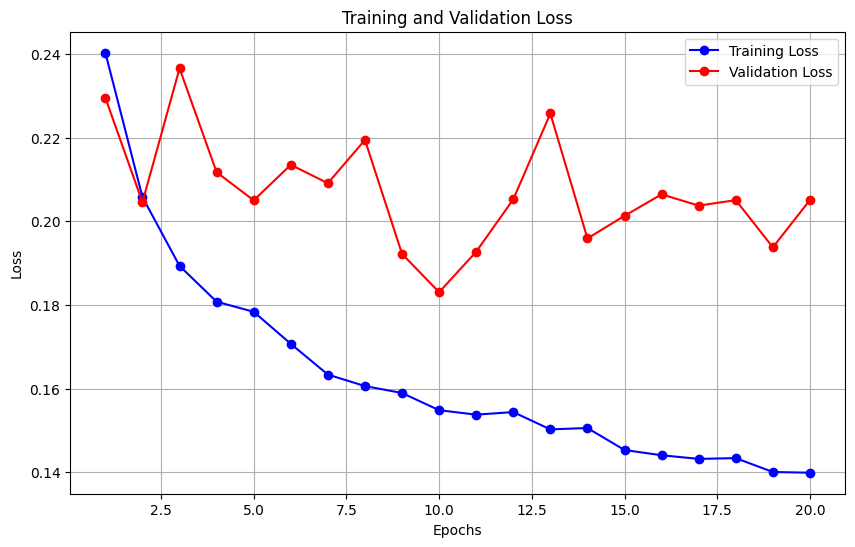

In [9]:
import matplotlib.pyplot as plt

train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Get the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

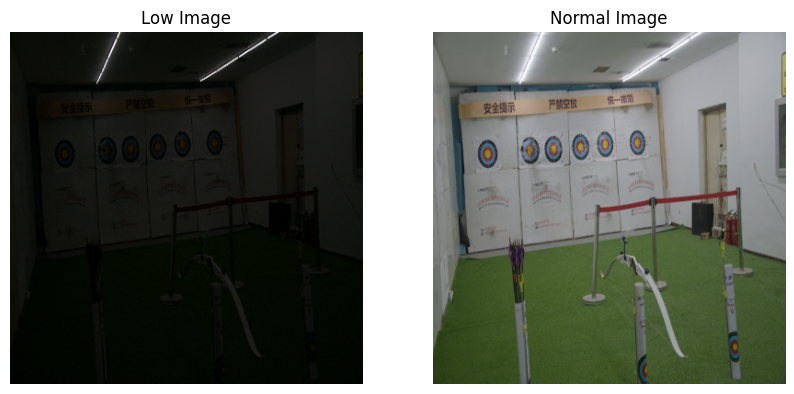

In [16]:
for low, normal in test_dataset.take(1):
    # Convert the TensorFlow tensor to a NumPy array
    low_image = low[0].numpy()  # First image in the batch (low image)
    normal_image = normal[0].numpy()  # First image in the batch (normal image)

    # Plot the images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Plot low image
    axes[0].imshow(low_image)
    axes[0].set_title("Low Image")
    axes[0].axis('off')  # Hide axis

    # Plot normal image
    axes[1].imshow(normal_image)
    axes[1].set_title("Normal Image")
    axes[1].axis('off')  # Hide axis

    # Display the plot
    plt.show()
    break

In [29]:
import cv2
from PIL import Image, ImageEnhance
import numpy as np
sharpen_kernel = np.array([
    [0, -0.15, 0],
    [-0.15, 1.6, -0.15],
    [0, -0.15, 0]
])

def apply_saturation(image_np, saturation_factor):
    # Convert NumPy array (0-1 float) to a PIL Image (0-255 uint8)
    image_np_uint8 = (image_np * 255).astype(np.uint8)
    pil_image = Image.fromarray(image_np_uint8)
    
    # Get the color enhancer
    enhancer = ImageEnhance.Color(pil_image)
    
    # Apply the enhancement
    enhanced_image = enhancer.enhance(saturation_factor)
    
    # Convert the enhanced PIL Image back to a NumPy array (0-1 float)
    saturated_image_np = np.array(enhanced_image) / 255.0
    
    return saturated_image_np

def increase_contrast(image, alpha=1.2, beta=0):
    # Ensure the image is in the correct range [0, 255]
    image = np.clip(image * 255.0, 0, 255).astype(np.uint8)
    
    # Apply alpha-beta contrast enhancement
    contrast_img = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    
    return contrast_img


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


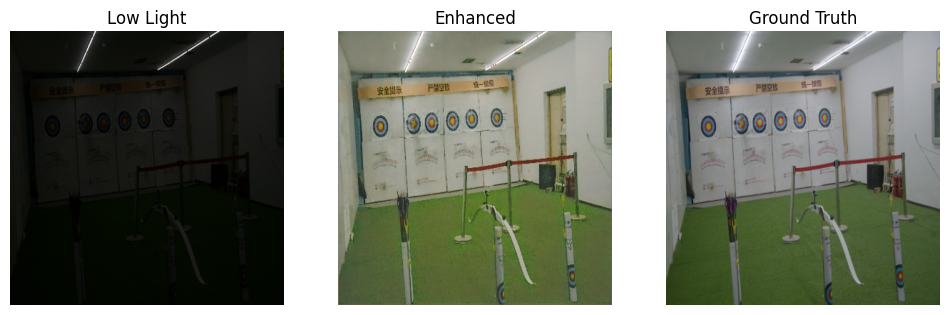

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


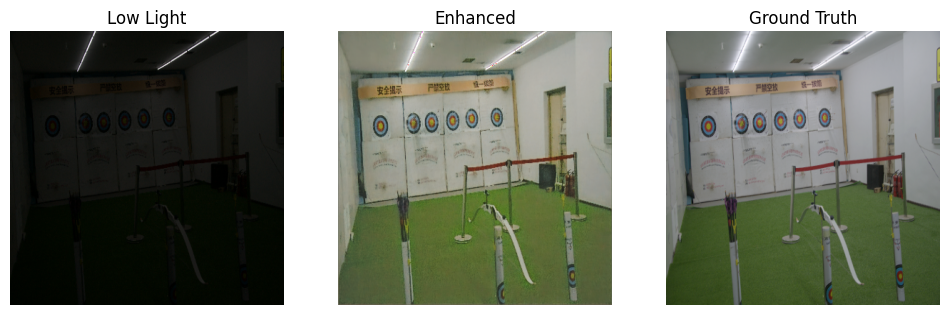

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


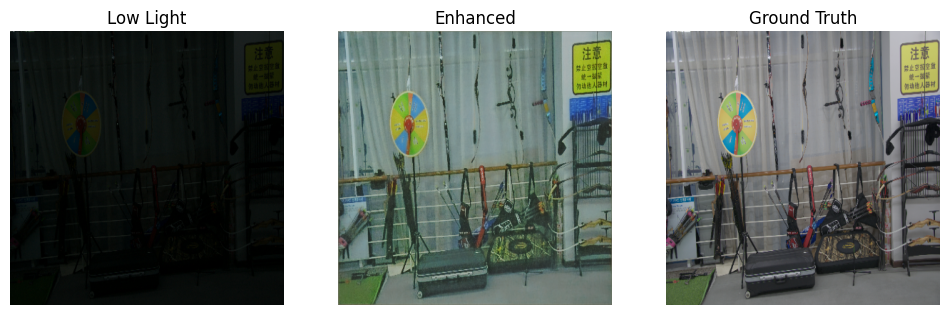

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


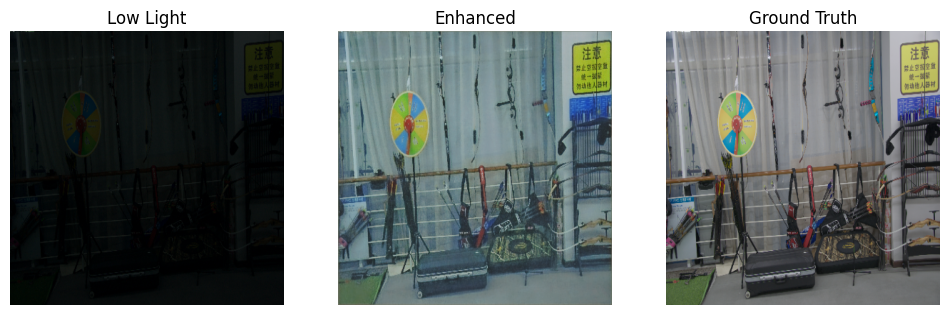

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


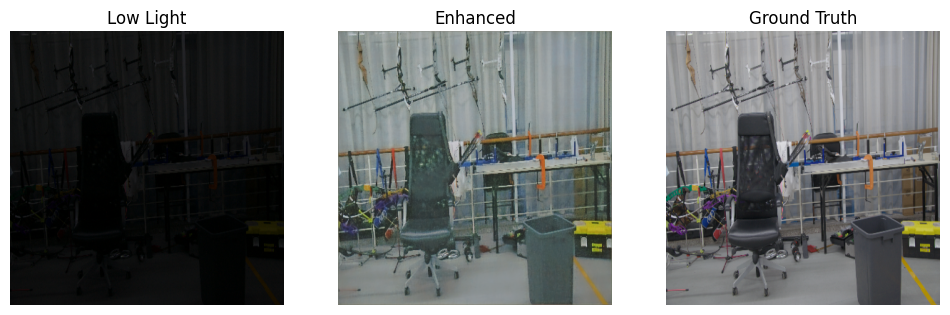

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


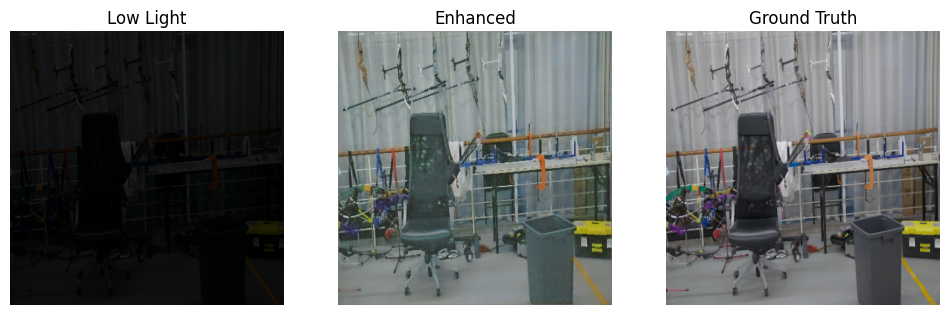

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


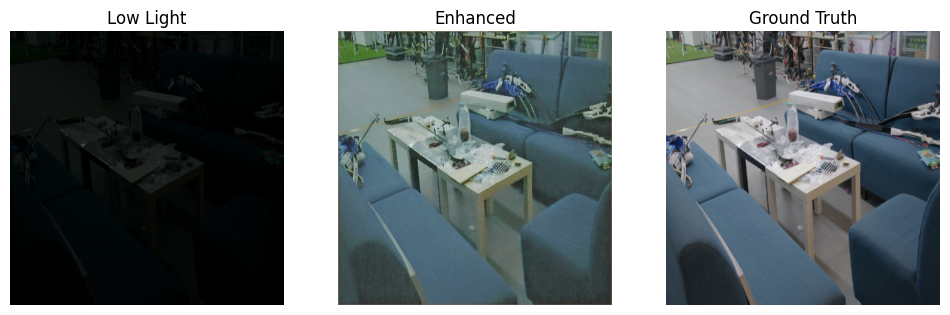

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


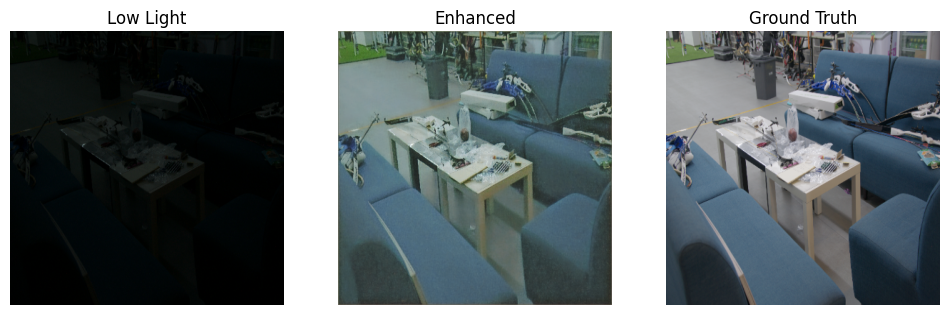

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


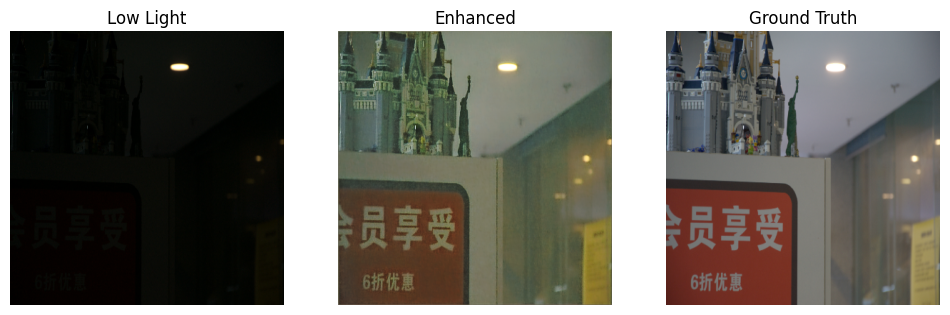

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


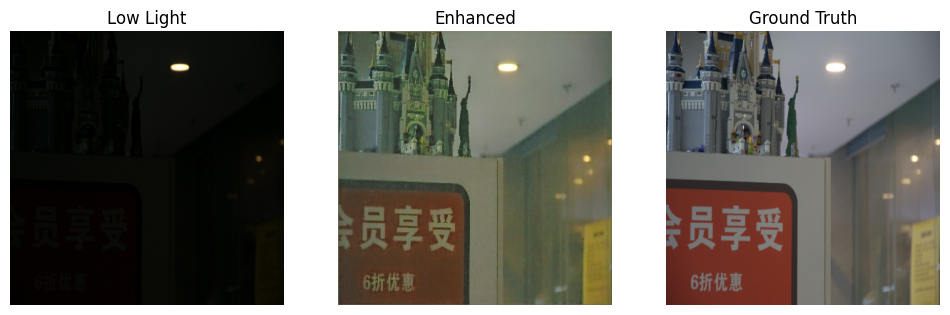

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


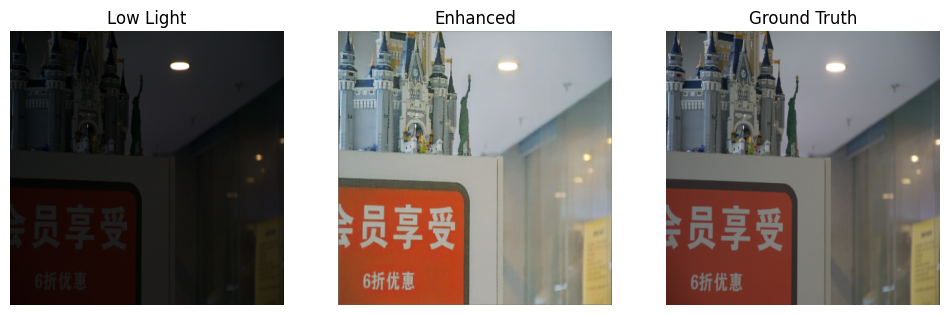

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


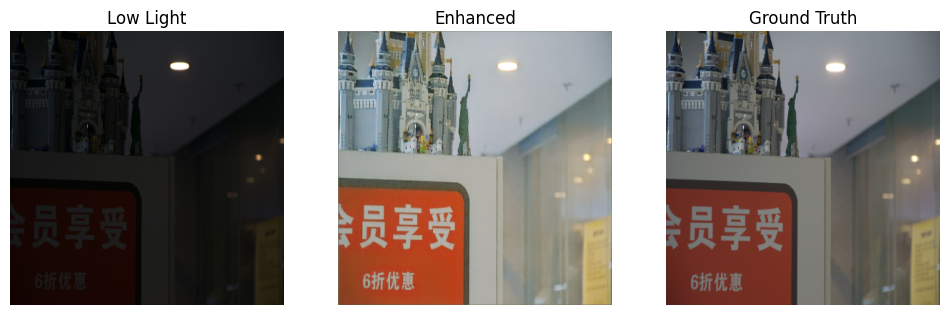

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


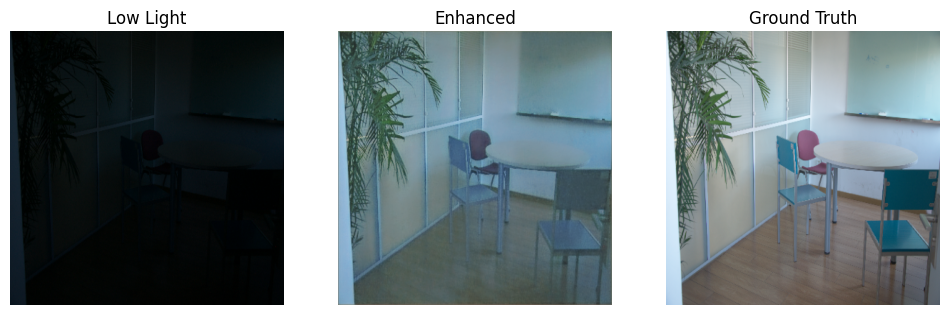

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


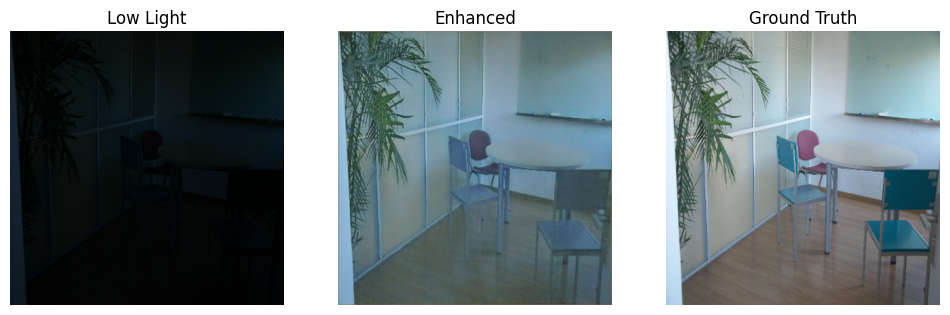

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


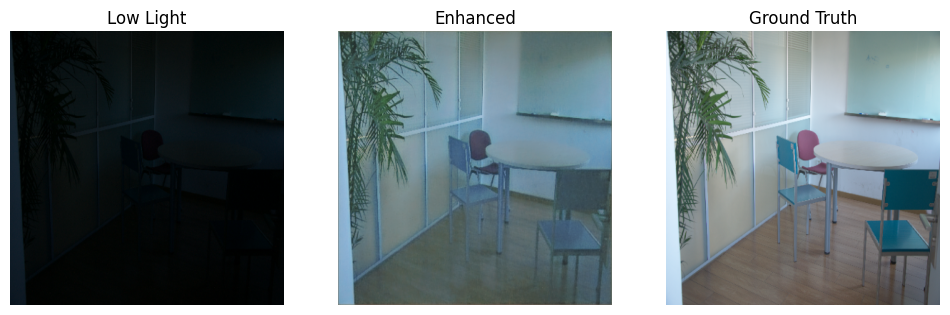

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


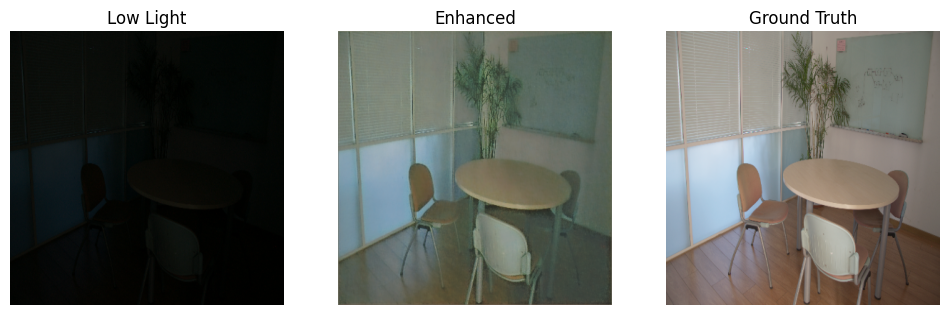

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


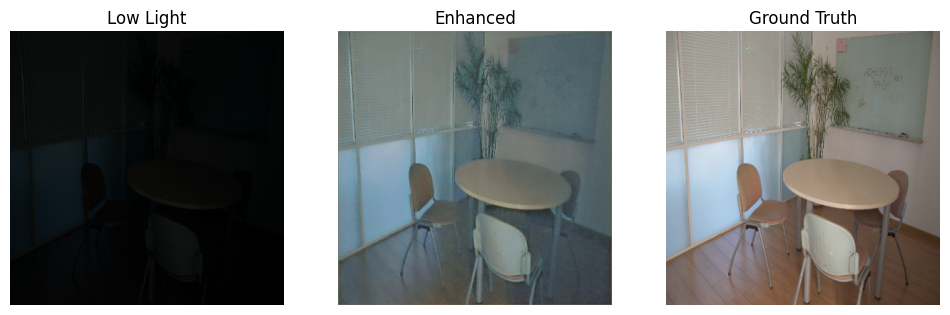

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


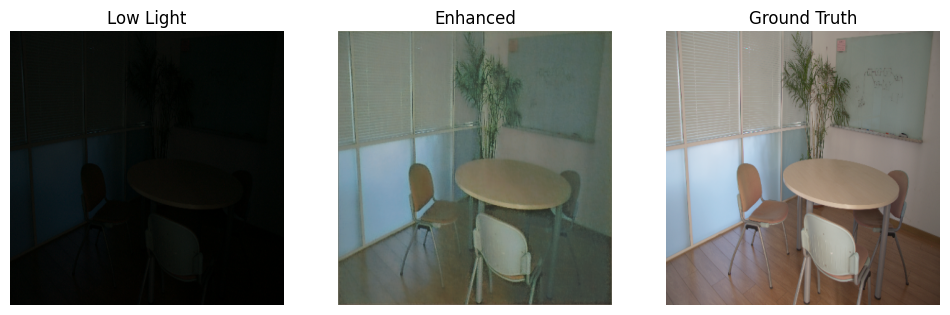

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


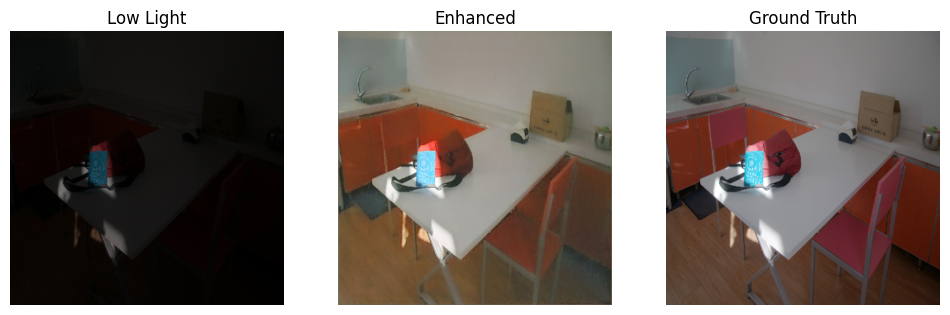

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


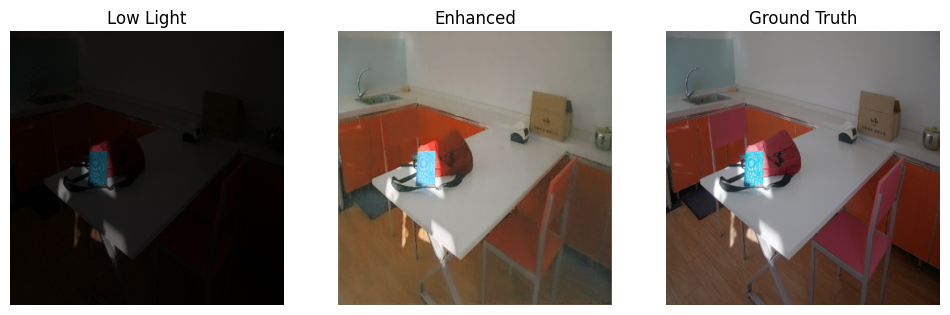

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


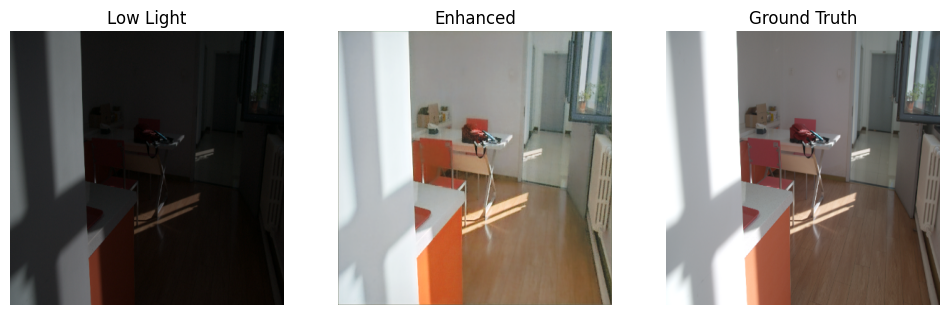

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


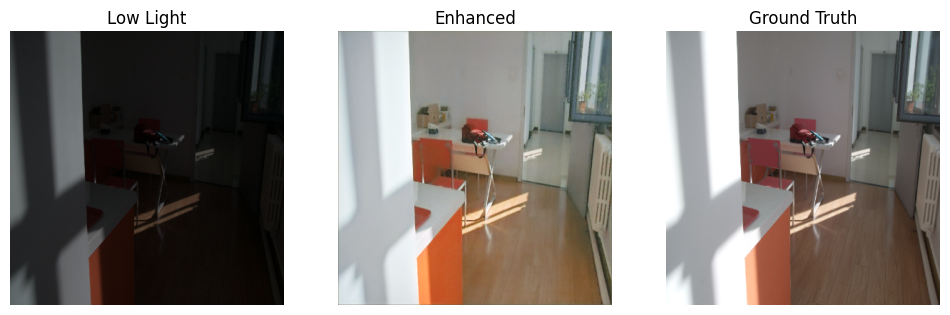

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


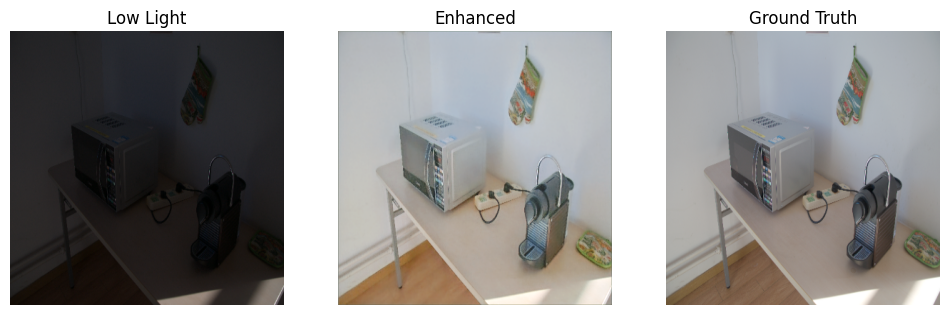

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


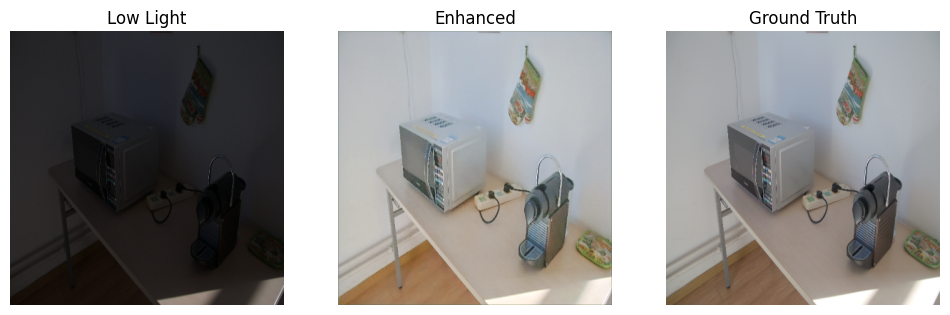

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


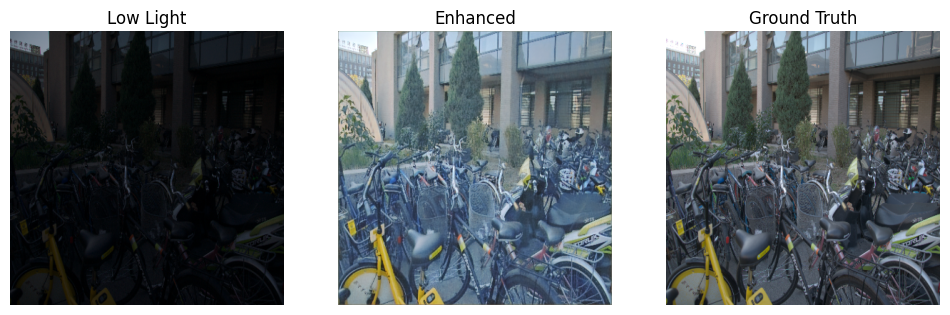

In [49]:
def show_predictions():
    count = 0  
    for batch_idx, (low, normal) in enumerate(test_dataset):
        
        for idx in range(low.shape[0]):  
            if count >= 25:
                return  
            
            low_img = low[idx].numpy()  
            ground_truth = normal[idx].numpy()  
            
            # Model prediction
            output_img = model.predict(np.expand_dims(low_img, axis=0))[0]
            enhanced_img1 = cv2.filter2D(output_img, -1, sharpen_kernel)  
            enhanced_img = apply_saturation(enhanced_img1, 1.15)  # Enhance saturation
            enhanced_img = increase_contrast(enhanced_img, alpha=1.15, beta=0)  # Apply contrast
           

            # Plot the results
            plt.figure(figsize=(12, 4))

           
            plt.subplot(1, 3, 1)
            plt.title('Low Light')
            plt.imshow(low_img)
            plt.axis('off')

         
            plt.subplot(1, 3, 2)
            plt.title('Enhanced')
            plt.imshow(enhanced_img)
            plt.axis('off')

            
            plt.subplot(1, 3, 3)
            plt.title('Ground Truth')
            plt.imshow(ground_truth)
            plt.axis('off')

            # Display the plot
            plt.show()

            # Increment the counter
            count += 1

show_predictions()